# Practical Session 2 : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

In [3]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the functions of the morpho library to visualize a disk structuring element of radius 3. 

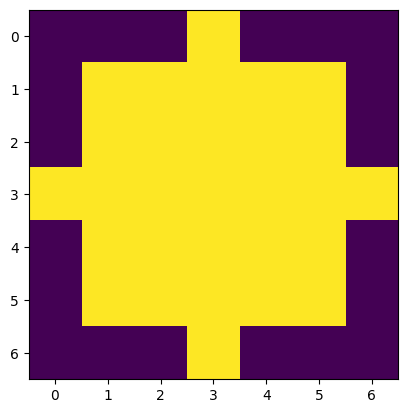

In [7]:
if student :
  strell = morpho.disk(3)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

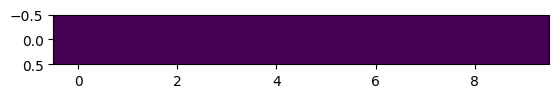

In [6]:
def line_strell(l):
  if student :
    strell = morpho.rectangle(1,l)
  return(strell)
if student :
  l = 10
  strell_line = line_strell(l)
  plt.imshow(strell_line)
  plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

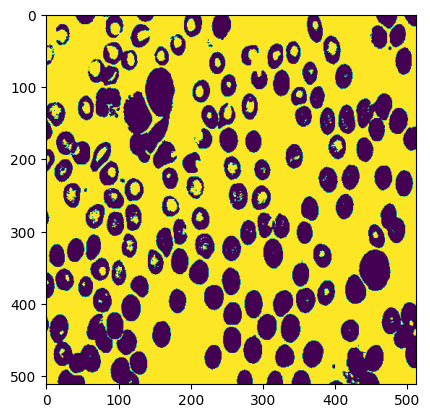

In [8]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  img = img > 150
  plt.imshow(img)
  plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

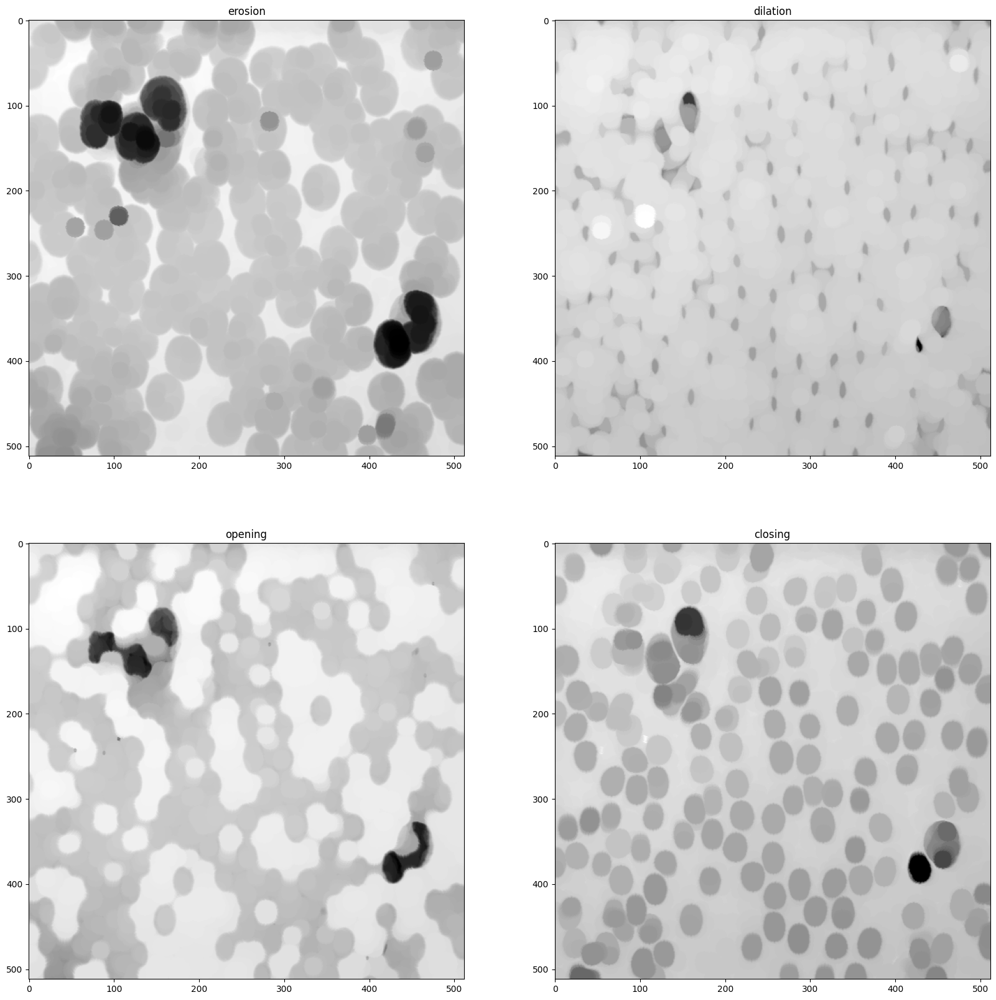

In [15]:
# try your own structuring elements and make the size vary
if student :
    strell = morpho.disk(10)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    im = skio.imread("images/cell.tif")
    imgs = [morpho.erosion(im, strell),morpho.dilation(im, strell),morpho.opening(im, strell),morpho.closing(im, strell)]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring element influences the the shape of separate objects in the image after a morphological operation. For exemple, a black spot in a cell will look more like a square after an dilation by a square structuring element than a disk one.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : Larger structuring elements have a more pronounced effect. It seems like applying a morphological operation with a large structuring element gives a result similar to applying several times a morphological operation with a smaller structuring element (not exactly the same result though)

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


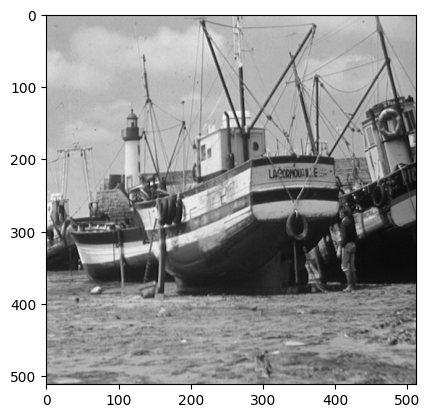

In [3]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes. 

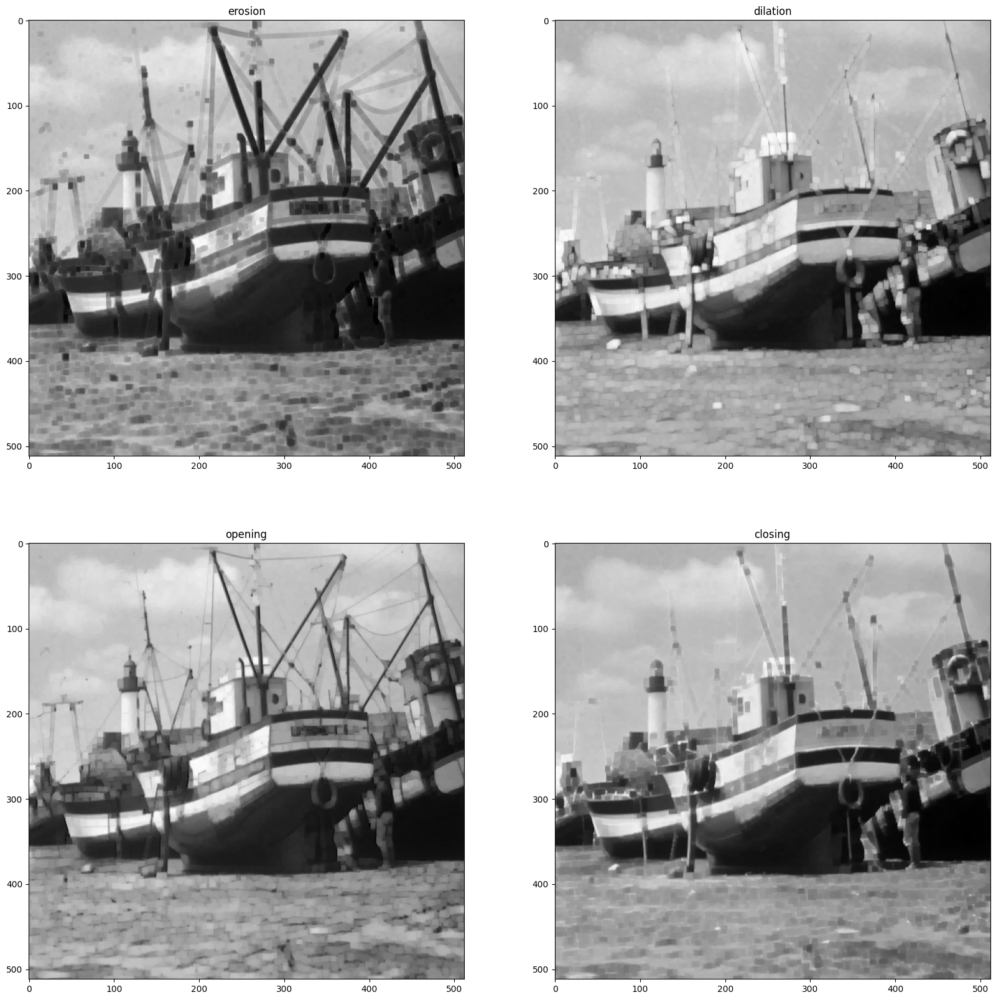

In [5]:
if student:
    img = skio.imread("images/bateau.tif")
    strell = morpho.square(5)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(img, strell),morpho.dilation(img, strell),morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : The size of the structuring element influences how "strongly" the operation is applied, whereas the shape of he structuring element influences the "shape" of frontiers between white and black parts of the image.

- **Q** : How can you illustrate the iterativity property of the dilation ? What is the
result of a dilation by a structuring element of size 2 followed by a dilation by a
structuring element of size 3 (and same shape) ? Show your illustration in the next cell.
- **A** : To illusrate the iterativity of the dilation, we can dilate an image by a structuring element twice, and compare it an image dilated by a structuring element of the same shape but twice the size.

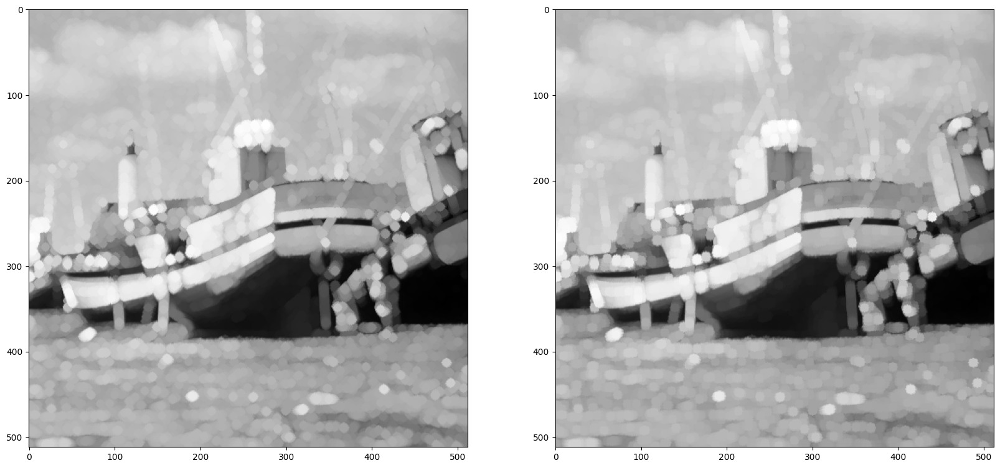

In [11]:
if student:
    img = skio.imread("images/bateau.tif")
    strell2 = morpho.disk(2)
    strell3 = morpho.disk(3)
    strell5 = morpho.disk(5)
    fig,ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(morpho.dilation(morpho.dilation(img, strell2),strell3), cmap="gray")
    ax[1].imshow(morpho.dilation(img, strell5), cmap="gray")
plt.show()

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


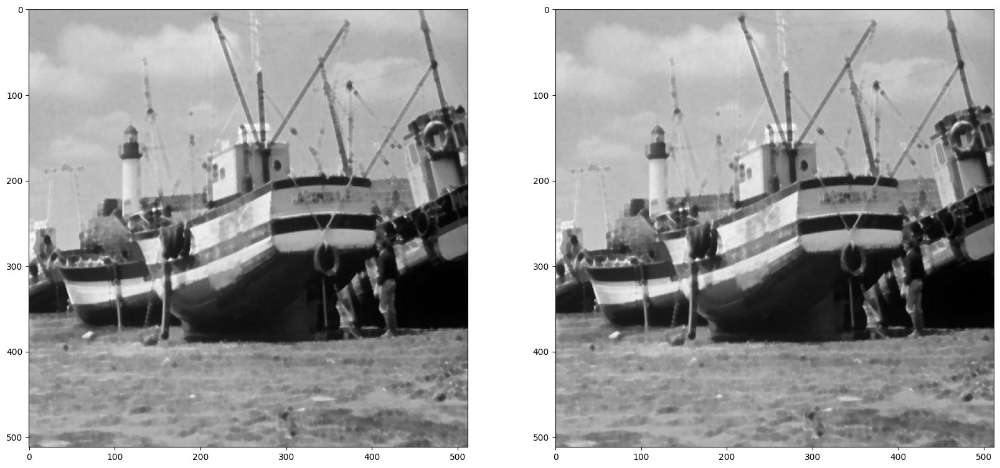

In [10]:
if student :
    img = skio.imread("images/bateau.tif")
    strell = morpho.disk(2)
    fig,ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(morpho.closing(morpho.closing(img, strell),strell), cmap="gray")
    ax[1].imshow(morpho.closing(img, strell), cmap="gray")
plt.show()

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : Top-hat extracts bright spots of the image that are smaller than the structuring element. The choice of the size of the structuring element influences the size of the features extracted from the image, whereas the choice of the shape influences the shape of those features.

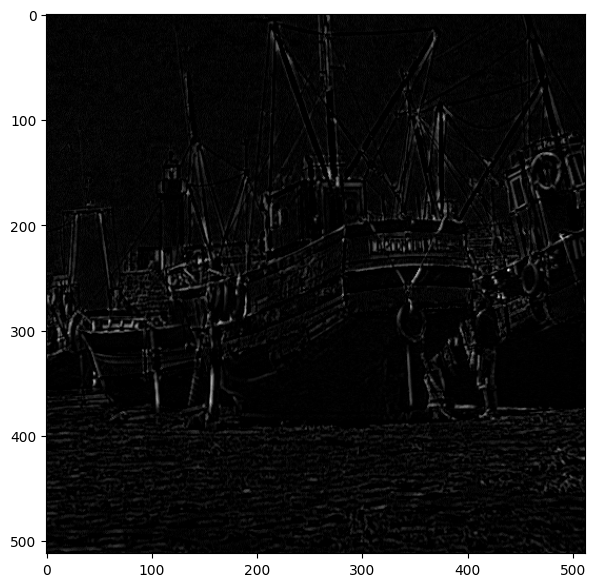

In [19]:
if student:
  strell = morpho.disk(2)
  top_hat = img - morpho.opening(img, strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : Dual top-hat extracts dark spots of the image that are smaller than the structuring element. The choice of the size of the structuring element influences the size of the features extracted from the image, whereas the choice of the shape influences the shape of those features.

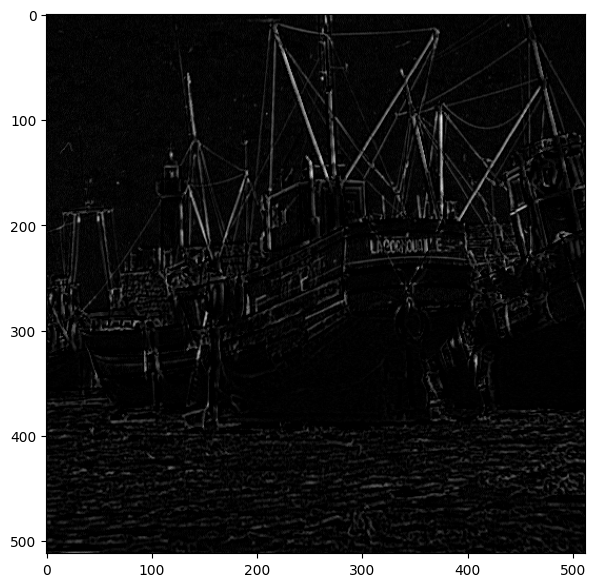

In [16]:
if student:
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img, strell) - img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by using the following code and trying out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: Using alternate sequential filters seems to simplify the image : the shape of the main features of the image is conserved, but the textures and variations in color inside one feature is removed. This filters could be used for feature extraction.

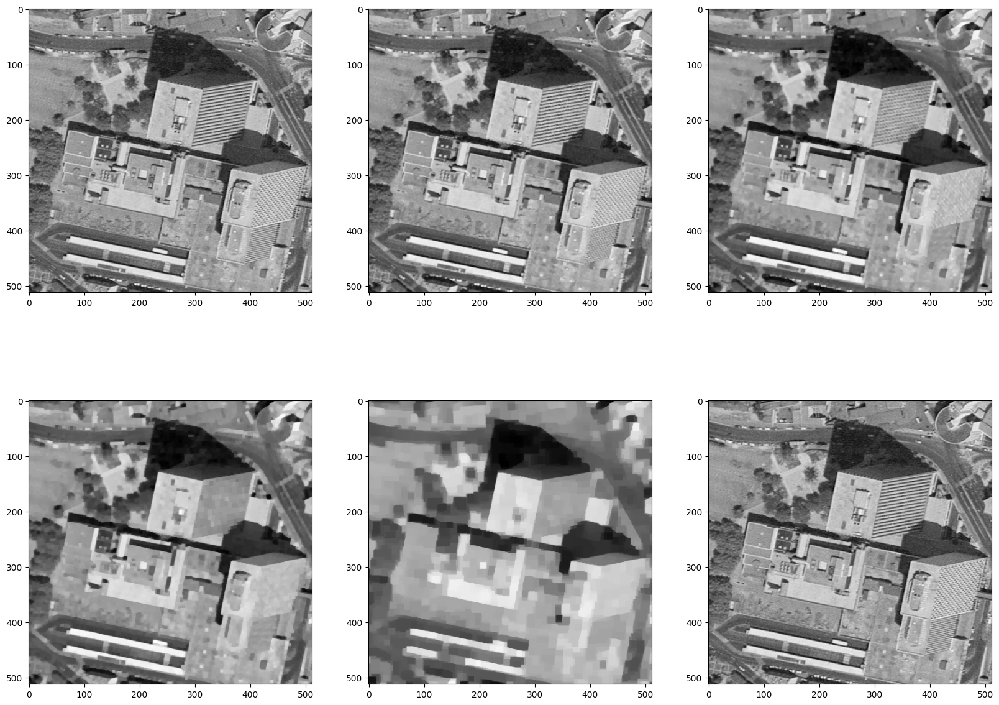

In [27]:
if student :
    img = skio.imread("images/montreuil.tif")
    ##img = skimage.util.random_noise(img, mode='gaussian', clip=True, var=0.05)
    se1=morpho.square(1)
    se2=morpho.square(2)
    se3=morpho.square(3)
    se4=morpho.square(4)
    se5=morpho.square(10)
    fas1=morpho.closing(morpho.opening(img,se1),se1)
    fas2=morpho.closing(morpho.opening(fas1,se2),se2)
    fas3=morpho.closing(morpho.opening(fas2,se3),se3)
    fas4=morpho.closing(morpho.opening(fas3,se4),se4)
    fas5=morpho.closing(morpho.opening(fas4,se5),se5)

    fig,ax = plt.subplots(2,3,figsize = (20,15))
    ax[0,0].imshow(fas1,cmap = "gray")
    ax[0,1].imshow(fas2,cmap = "gray")
    ax[0,2].imshow(fas3,cmap = "gray")
    ax[1,0].imshow(fas4,cmap = "gray")
    ax[1,1].imshow(fas5,cmap = "gray")
    ax[1,2].imshow(img,cmap = "gray")
    plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: Morphological gradient exposes the parts of the image where the variation of intensity is the greatest.

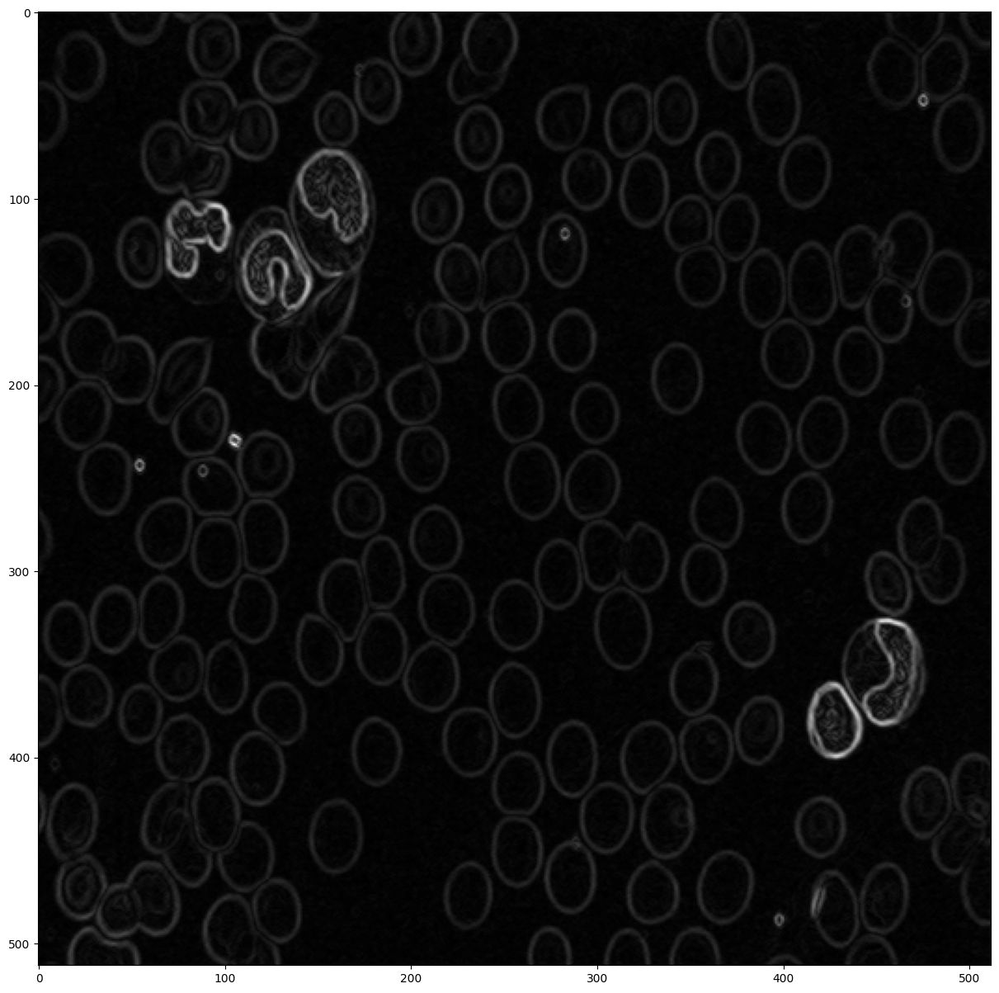

In [5]:
if student : 
  img = skio.imread("images/cell.tif")
  strell = morpho.disk(1)
  morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : The morphological gradient preserved the outlines of the cells but also the features inside each cells because they were, although thin, bright lines with a dark surroundings.

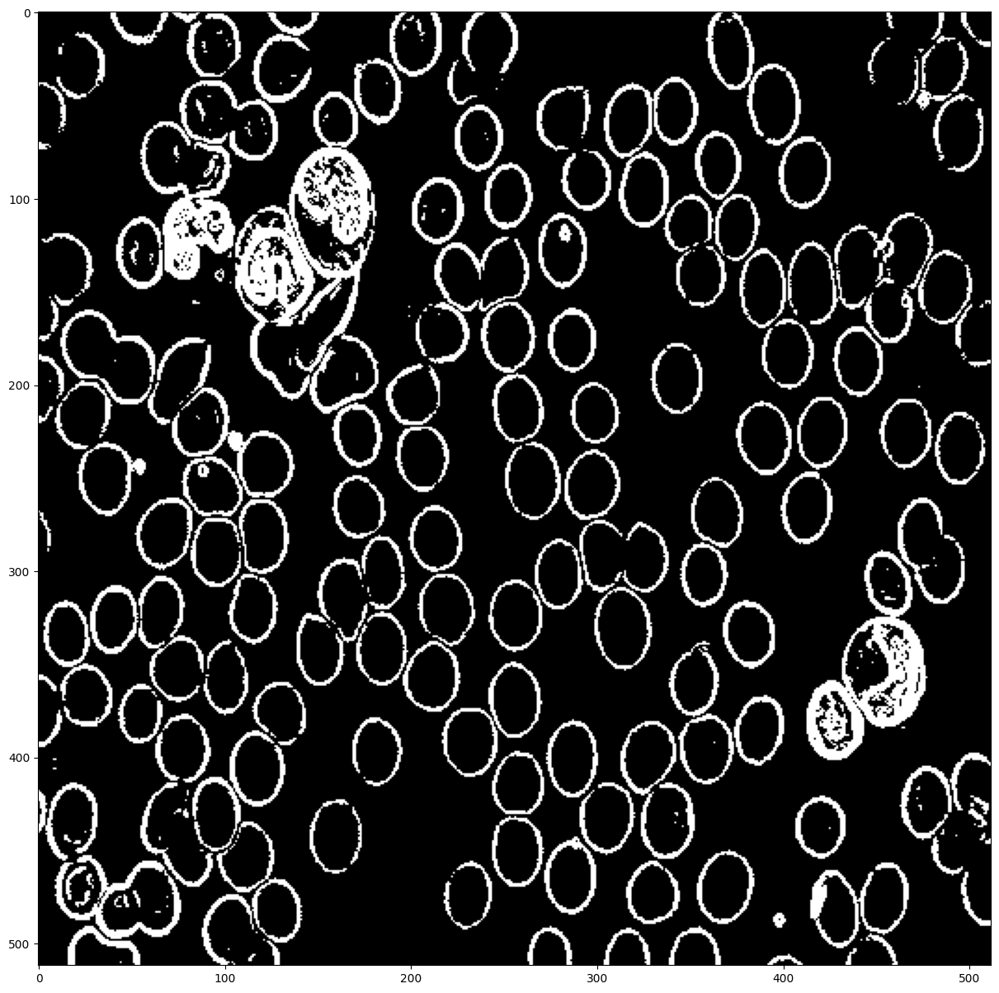

In [29]:
if student :
  thresh_grad = morpho_grad > 9
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) ...
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) ...

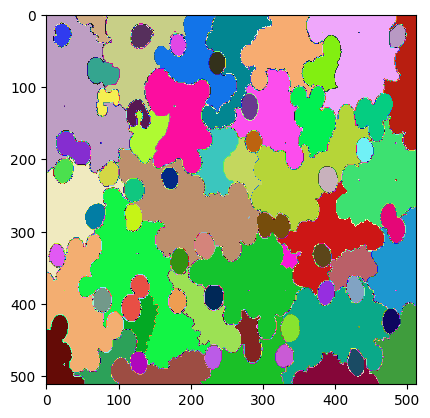

In [38]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = skimage.segmentation.watershed(morpho_grad, 100)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) ...
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) ...

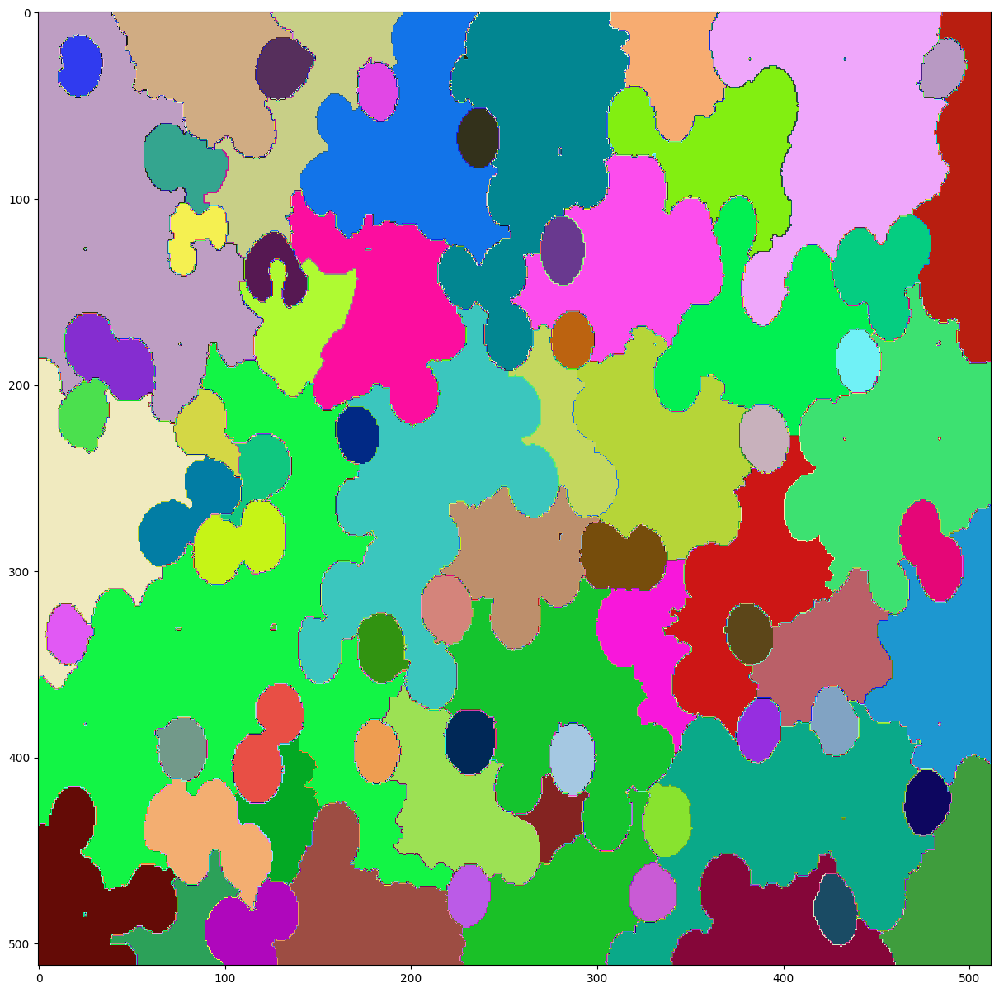

In [40]:
if student :
  wat_closing = skimage.segmentation.watershed(morpho.closing(morpho_grad, morpho.disk(1)), 100)
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

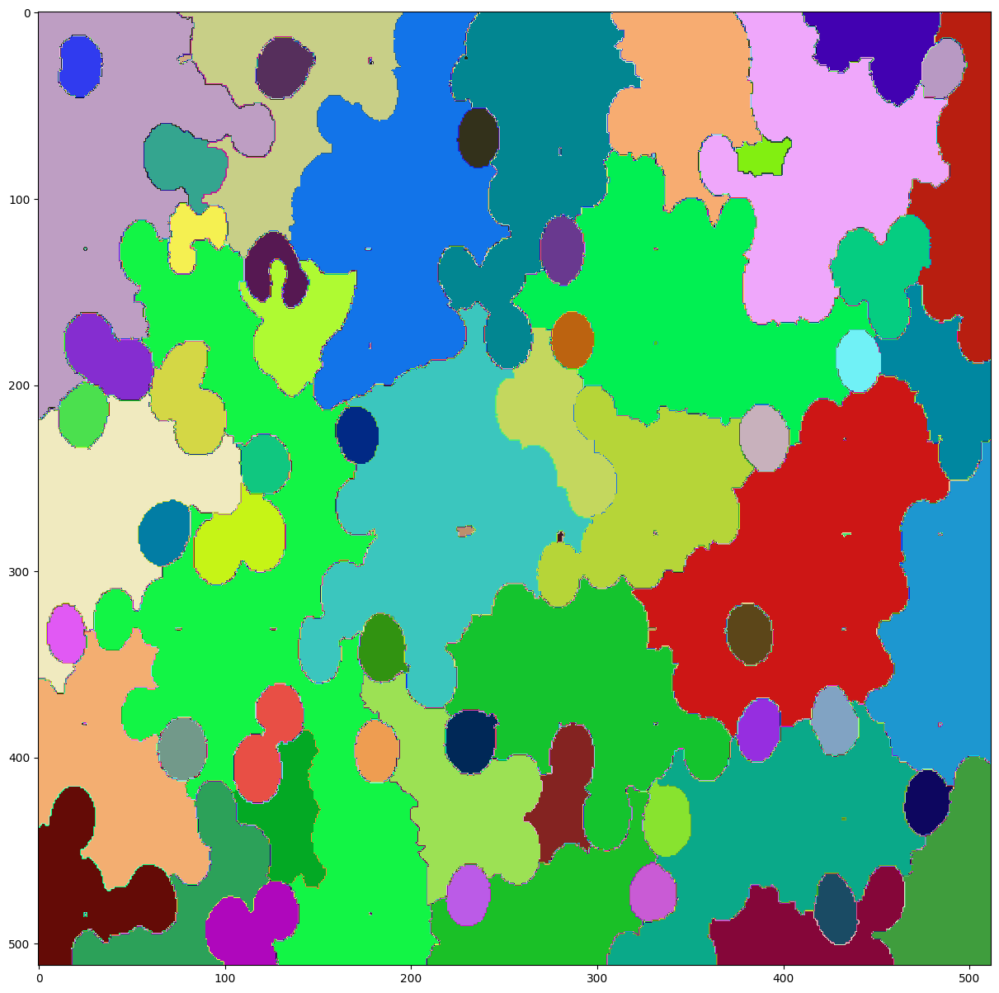

In [41]:
if student :
  wat_opening = skimage.segmentation.watershed(morpho.opening(morpho_grad, morpho.disk(1)), 100)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

We now propose to try to do better than what you did with the closure and opening by using specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

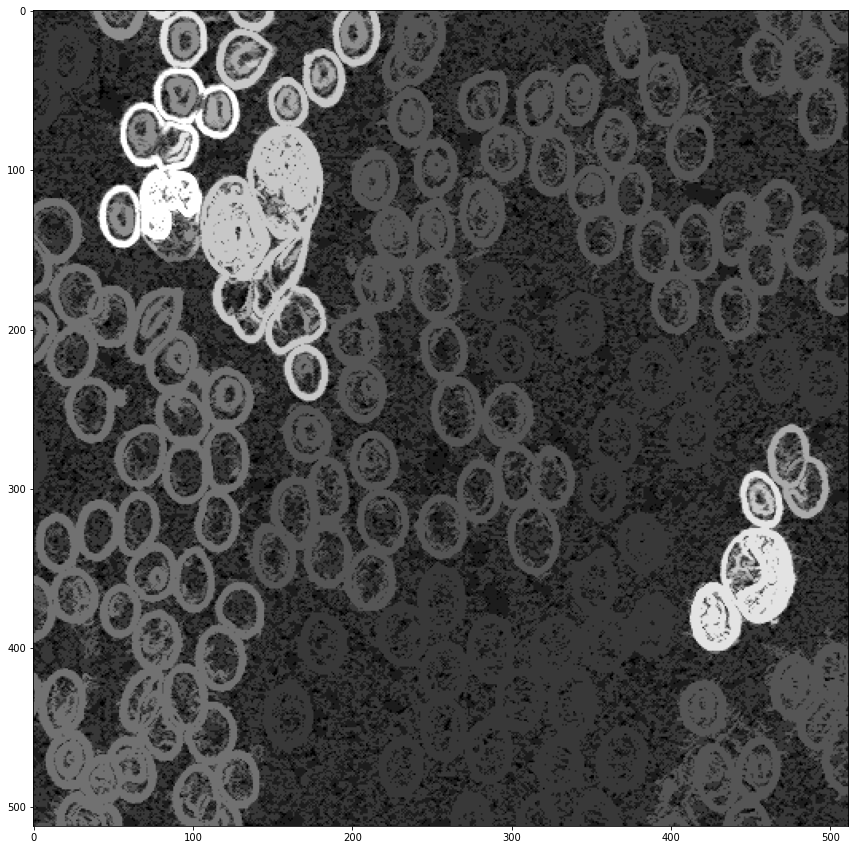

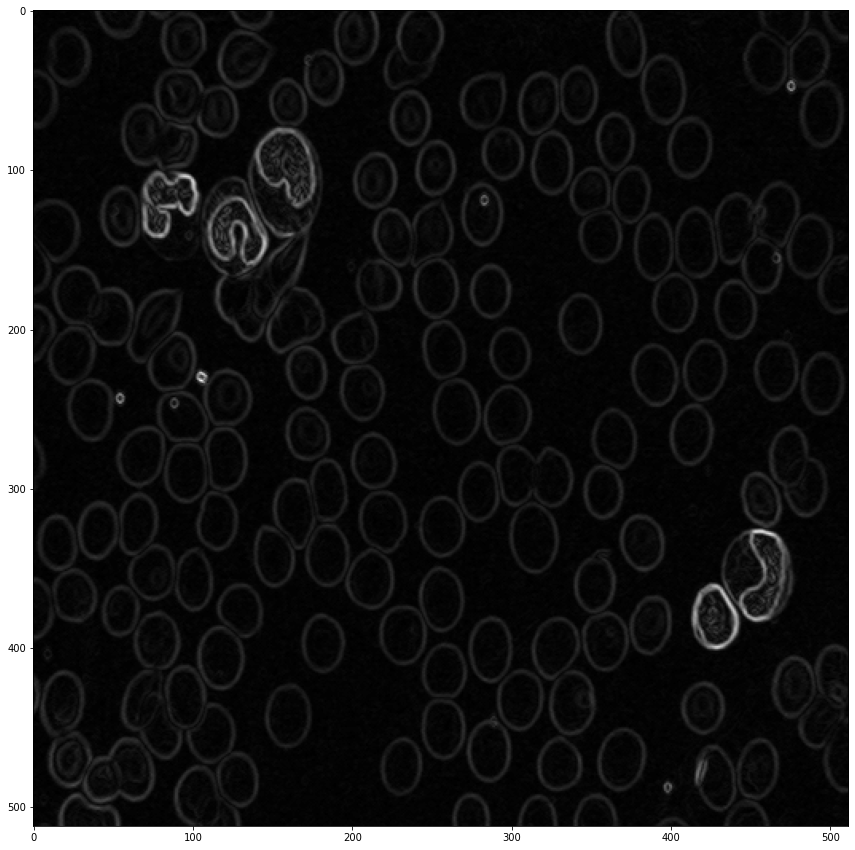

In [ ]:
imOpen = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()
plt.figure(figsize =(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

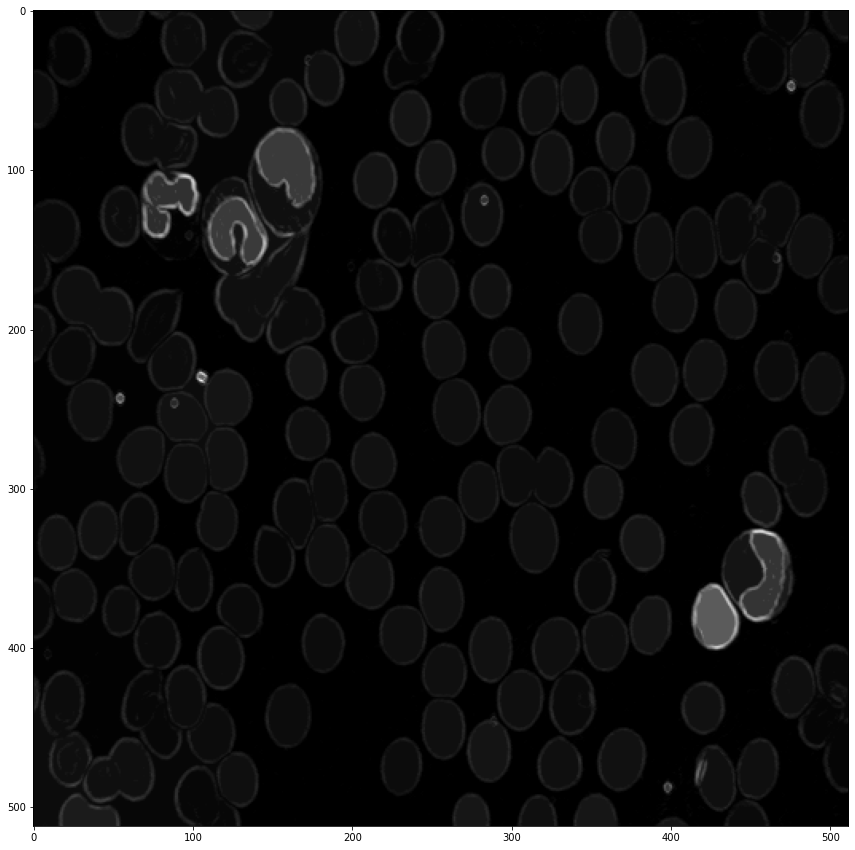

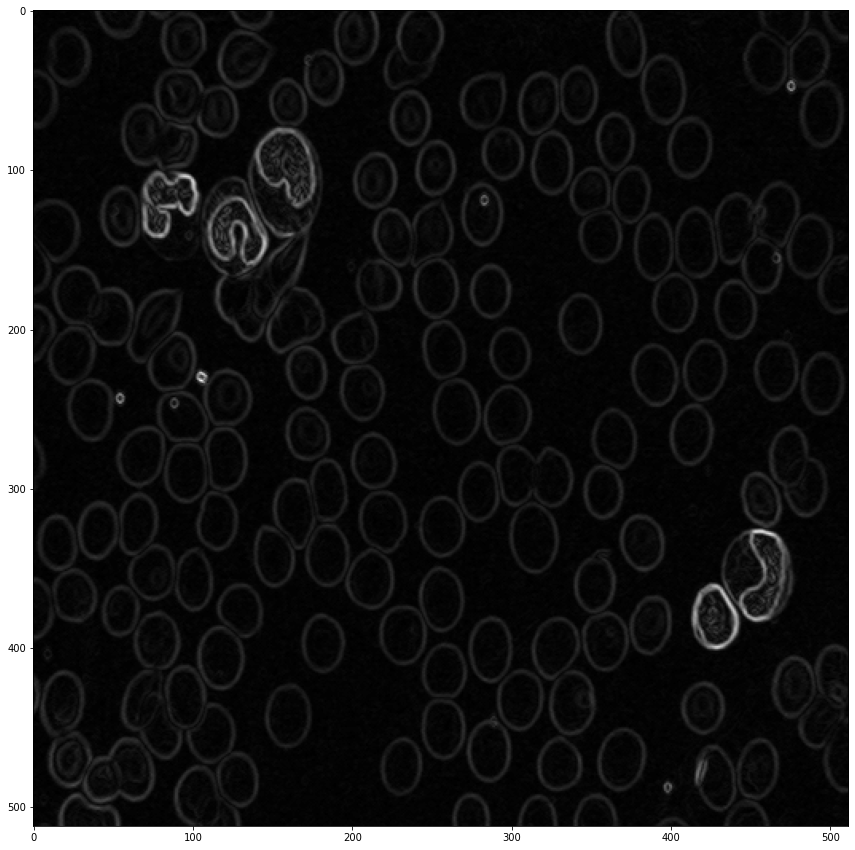

In [ ]:
imClos = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

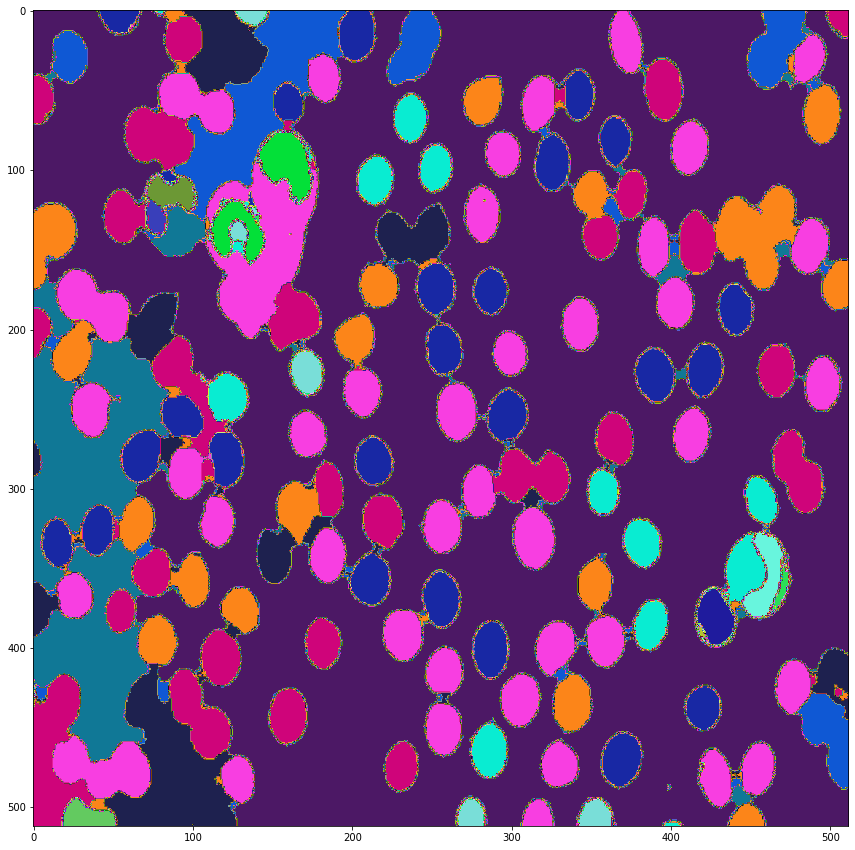

In [ ]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()